# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

**Business Task:**
Identify the key drivers for used car prices.

**Data Mining Problem Definition:**
Formulate a supervised data mining task to model and predict used car prices based on available vehicle attributes and market data. This involves defining the target variable (used car price, or log price) and identifying potential predictor variables (e.g., make, model, mileage, age, condition, location). The objective is to use predictive modeling techniques such as regression analysis to uncover the relative importance and influence of these factors on price, enabling actionable insights into the determinants of used car values.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [2]:
# Install packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# pd.set_option('display.max_rows', 100)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 50)

In [6]:
import notebook
print(notebook.__version__)

7.2.2


In [8]:
data = pd.read_csv('data/vehicles.csv')
data.shape

(426880, 18)

In [10]:
data.head(3)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [14]:
data.isnull().sum()

id                   0
region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

In [16]:
data.isnull().sum() / 426880 * 100

id               0.000000
region           0.000000
price            0.000000
year             0.282281
manufacturer     4.133714
model            1.236179
condition       40.785232
cylinders       41.622470
fuel             0.705819
odometer         1.030735
title_status     1.930753
transmission     0.598763
VIN             37.725356
drive           30.586347
size            71.767476
type            21.752717
paint_color     30.501078
state            0.000000
dtype: float64

In [18]:
data.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [20]:
data[['id','price','year','odometer']].isnull().sum() / 426880 * 100

id          0.000000
price       0.000000
year        0.282281
odometer    1.030735
dtype: float64

In [22]:
1.000000e+07

10000000.0

In [24]:
data.duplicated().sum()

0

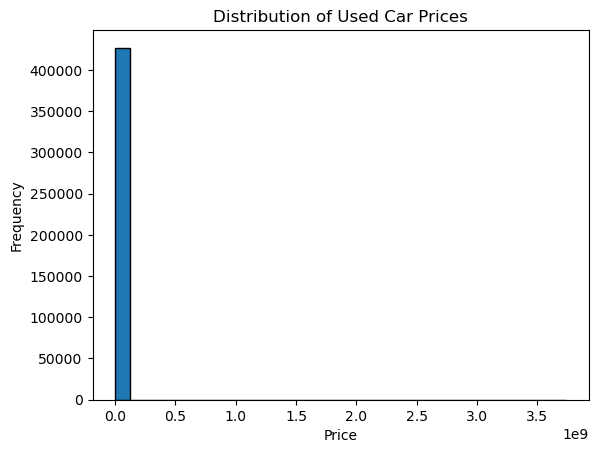

In [25]:
plt.hist(data['price'], bins=30, edgecolor='black')
plt.title('Distribution of Used Car Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

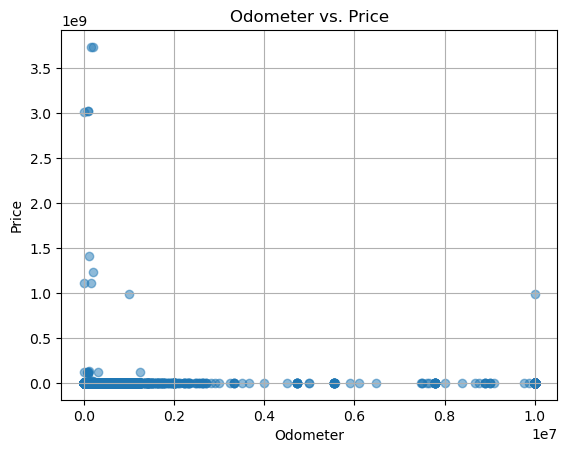

In [27]:
plt.scatter(data['odometer'], data['price'], alpha=0.5)
plt.title('Odometer vs. Price')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.grid(True)
plt.show()

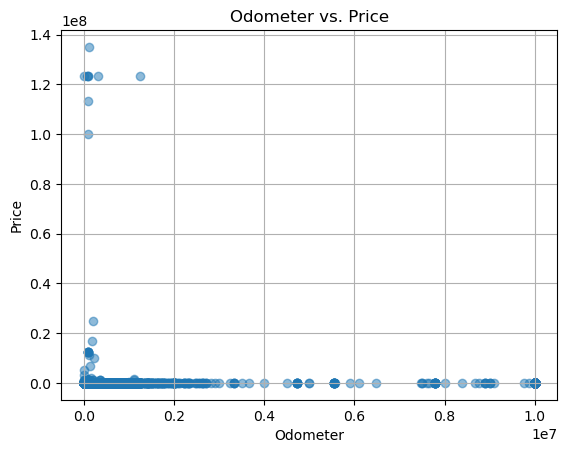

In [29]:
plt.scatter(data.loc[data['price']<5.0e+08]['odometer'], data.loc[data['price']<5.0e+08]['price'], alpha=0.5)
plt.title('Odometer vs. Price')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.grid(True)
plt.show()

In [31]:
data.loc[(data['price']>1.0e+06) & (data['price']<5.0e+08)].shape#.info()

(42, 18)

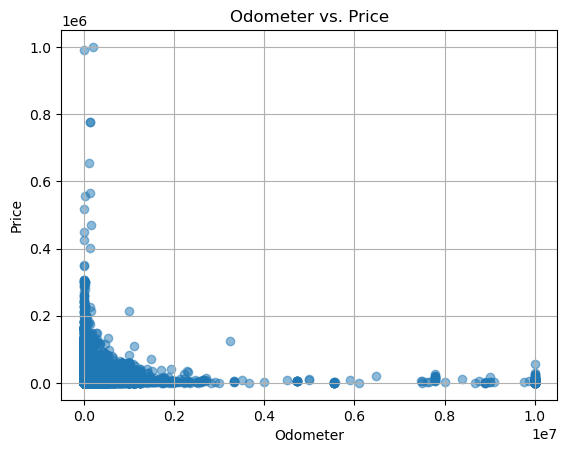

In [32]:
plt.scatter(data.loc[data['price']<1.0e+06]['odometer'], data.loc[data['price']<1.0e+06]['price'], alpha=0.5)
plt.title('Odometer vs. Price')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.grid(True)
plt.show()

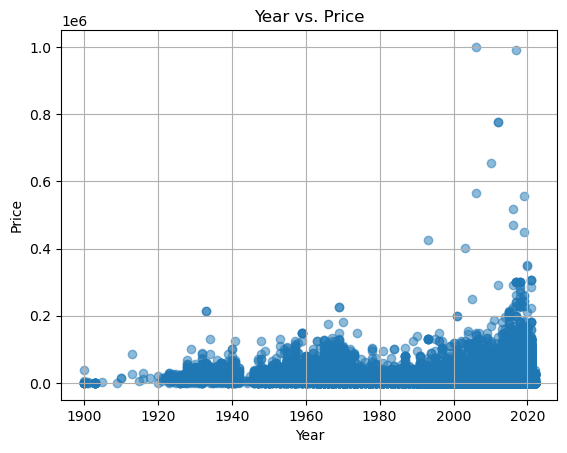

In [35]:
plt.scatter(data.loc[data['price']<1.0e+06]['year'], data.loc[data['price']<1.0e+06]['price'], alpha=0.5)
plt.title('Year vs. Price')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(True)
plt.show()

In [36]:
data.loc[data['price']>1.0e+06].describe()

,id,price,year,odometer
count,5.300000e+01,5.300000e+01,53.000000,5.300000e+01
mean,7.309548e+09,4.649499e+08,1989.169811,3.704945e+05
std,5.923261e+06,9.990088e+08,27.339557,1.376031e+06
min,7.301833e+09,1.111111e+06,1902.000000,0.000000e+00
25%,7.303382e+09,1.234567e+06,1960.000000,9.999900e+04
50%,7.308749e+09,1.234568e+07,1999.000000,1.000000e+05
75%,7.315836e+09,1.234568e+08,2010.000000,1.640000e+05
max,7.317052e+09,3.736929e+09,2021.000000,9.999999e+06


In [38]:
data.loc[data['price']>1.0e+06]#.info()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
280,7315849335,birmingham,987654321,1960.0,chevrolet,NaN,NaN,NaN,gas,999999.0,clean,manual,NaN,NaN,NaN,NaN,NaN,al
1838,7315961634,dothan,99999999,1993.0,ford,ranger,NaN,NaN,gas,99999.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,al
26075,7314964461,fresno / madera,1111111,2014.0,chevrolet,NaN,NaN,NaN,other,11.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,ca
29386,7305265540,humboldt county,1111111111,1999.0,ford,f350 super duty lariat,good,8 cylinders,diesel,149000.0,clean,automatic,NaN,rwd,full-size,pickup,white,ca
37409,7314053169,modesto,1111111111,2020.0,jeep,NaN,NaN,NaN,gas,1000.0,clean,automatic,NaN,4wd,NaN,NaN,NaN,ca
37410,7314052904,modesto,3009548743,2021.0,chevrolet,NaN,NaN,8 cylinders,gas,1000.0,clean,automatic,NaN,4wd,NaN,NaN,NaN,ca
68935,7302895209,ventura county,2000000,2002.0,saturn,l-series l200 4dr sedan,good,4 cylinders,gas,164290.0,clean,automatic,NaN,fwd,mid-size,sedan,green,ca
91576,7309730903,delaware,3024942282,2000.0,mercedes-benz,benz e320,NaN,NaN,gas,100000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,de
105843,7314124996,orlando,6995495,2014.0,dodge,journey,NaN,4 cylinders,gas,135888.0,clean,automatic,3C4PDCAB5ET204162,fwd,NaN,SUV,NaN,fl
122470,7315836487,atlanta,987654321,1960.0,chevrolet,NaN,NaN,NaN,gas,9999999.0,clean,manual,NaN,NaN,NaN,NaN,NaN,ga


In [40]:
data[data['price'] < 0].shape

(0, 18)

In [44]:
data[data['odometer'] > 1000000]['odometer'].unique()

array([ 9999999.,  2222222.,  1111111.,  8888888.,  1234567., 10000000.,
        7654321.,  1234689.,  8000000.,  2076920.,  1239494.,  1753761.,
        9750924.,  1222222.,  1075000.,  2000000.,  2006000.,  8393929.,
        1252993.,  4000000.,  1500005.,  1250003.,  1017923.,  2308454.,
        1222334.,  1870000.,  2009992.,  1200000.,  1230000.,  3500000.,
        1773890.,  3333333.,  1411877.,  1240002.,  2814501.,  1862563.,
        2006330.,  1234566.,  2319010.,  1547940.,  8675309.,  2120691.,
        1932306.,  5577788.,  1607575.,  1450000.,  1150000.,  1255590.,
        2580000.,  1430000.,  1176458.,  1157000.,  1400000.,  1091331.,
        1750000.,  1000425.,  5900000.,  1335000.,  1999999.,  1430002.,
        1100000.,  1018000.,  2070000.,  7465644.,  7777777.,  1760000.,
        1560000.,  7500000.,  3000000.,  1630002.,  1115000.,  1020000.,
        2610730.,  5000000.,  1178855.,  2006332.,  1920000.,  2281514.,
        1000100.,  3245000.,  1390000.,  1195885., 

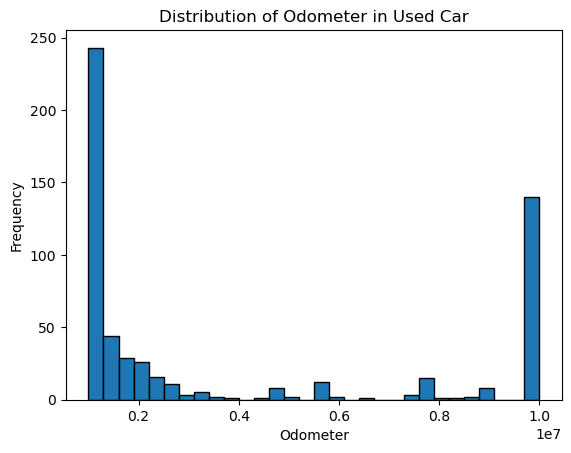

In [46]:
plt.hist(data.loc[data['odometer']>1000000]['odometer'], bins=30, edgecolor='black')
plt.title('Distribution of Odometer in Used Car')
plt.xlabel('Odometer')
plt.ylabel('Frequency')
plt.show()

In [48]:
data.loc[(data['odometer']>9.0e+05) & (data['odometer']<1.0e+06)]

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
280,7315849335,birmingham,987654321,1960.0,chevrolet,NaN,NaN,NaN,gas,999999.0,clean,manual,NaN,NaN,NaN,NaN,NaN,al
2781,7314615999,huntsville / decatur,23000,1967.0,chevrolet,c10 truck,good,8 cylinders,gas,999999.0,clean,automatic,NaN,rwd,full-size,truck,red,al
2820,7314200906,huntsville / decatur,1000,1973.0,toyota,NaN,NaN,NaN,other,999999.0,missing,other,NaN,NaN,NaN,NaN,NaN,al
5560,7314563950,anchorage / mat-su,4600,2006.0,ford,taurus se,NaN,NaN,gas,999999.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,ak
5566,7314560797,anchorage / mat-su,6900,1999.0,ford,ranger,NaN,NaN,gas,999999.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,ak
5567,7314558788,anchorage / mat-su,3500,1997.0,mercury,mountaineer,NaN,NaN,gas,999999.0,clean,automatic,NaN,NaN,NaN,NaN,white,ak
5583,7314530222,anchorage / mat-su,2800,1988.0,chevrolet,rally,NaN,NaN,gas,999999.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,ak
6110,7311668725,anchorage / mat-su,2200,1987.0,ford,f150,NaN,NaN,gas,999999.0,clean,automatic,NaN,NaN,NaN,NaN,grey,ak
8495,7316221976,flagstaff / sedona,213000,1933.0,ford,2 dr victoria,NaN,NaN,gas,999999.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,az
8616,7314442474,flagstaff / sedona,1895,2000.0,chevrolet,venture,good,6 cylinders,gas,999999.0,clean,automatic,NaN,fwd,mid-size,mini-van,grey,az


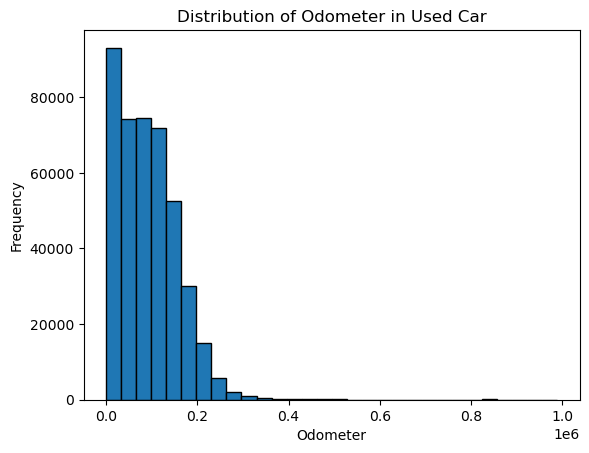

In [50]:
#Action: Remove cars with odometer less than 6.0e+05
plt.hist(data.loc[(data['price']<4.0e+05) & (data['odometer']<9.9e+05)]['odometer'], bins=30, edgecolor='black')
plt.title('Distribution of Odometer in Used Car')
plt.xlabel('Odometer')
plt.ylabel('Frequency')
plt.show()

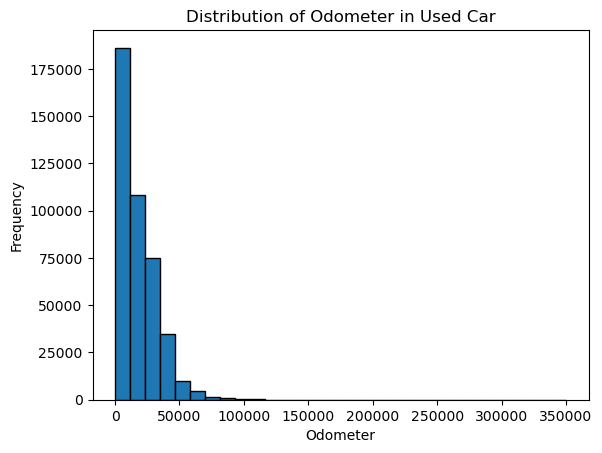

In [52]:
plt.hist(data.loc[(data['price']<4.0e+05) & (data['odometer']<9.9e+05)]['price'], bins=30, edgecolor='black')
plt.title('Distribution of Odometer in Used Car')
plt.xlabel('Odometer')
plt.ylabel('Frequency')
plt.show()

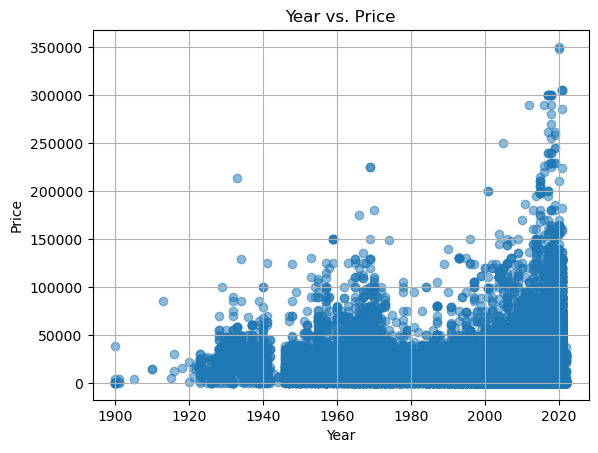

In [54]:
#Action: Look further into number of cars by year
plt.scatter(data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05)]['year'], data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05)]['price'], alpha=0.5)
plt.title('Year vs. Price')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(True)
plt.show()

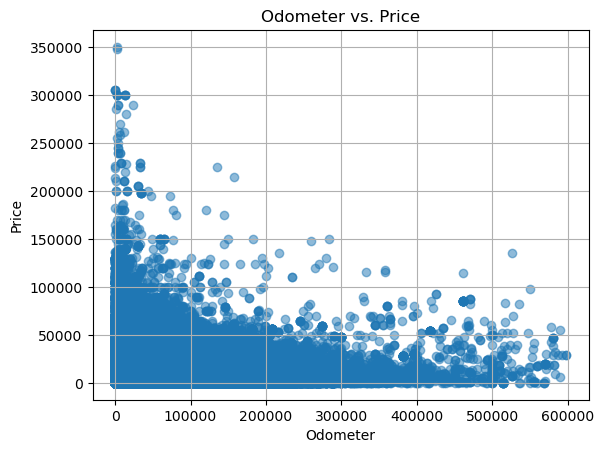

In [55]:
plt.scatter(data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05)]['odometer'], data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05)]['price'], alpha=0.5)
plt.title('Odometer vs. Price')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.grid(True)
plt.show()

In [57]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05)].head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,3GTP1VEC4EG551563,NaN,NaN,pickup,white,al
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,1GCSCSE06AZ123805,NaN,NaN,pickup,blue,al
29,7316814989,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,clean,other,3GCPWCED5LG130317,NaN,NaN,pickup,red,al
30,7316743432,auburn,30990,2017.0,toyota,tundra double cab sr,good,8 cylinders,gas,41124.0,clean,other,5TFRM5F17HX120972,NaN,NaN,pickup,red,al
31,7316356412,auburn,15000,2013.0,ford,f-150 xlt,excellent,6 cylinders,gas,128000.0,clean,automatic,NaN,rwd,full-size,truck,black,al


In [61]:
#Action: Remove vehicles made prior to 1923 because the sample set for that period is so small
temp = data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05)]['year'].value_counts()
temp_df = temp.reset_index()
temp_df.columns = ['year', 'count']
temp_df = temp_df.sort_values(by='year')#.reset_index(inplace=False)
temp_df

,year,count
95,1900.0,11
98,1901.0,3
110,1905.0,1
104,1910.0,2
106,1913.0,1
108,1915.0,1
101,1916.0,2
105,1918.0,1
103,1920.0,2
102,1921.0,2


In [63]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['manufacturer'].value_counts()

manufacturer
ford               70086
chevrolet          54203
toyota             33760
honda              20994
nissan             18795
jeep               18786
ram                18207
gmc                16577
bmw                14601
dodge              13525
mercedes-benz      11585
hyundai            10207
subaru              9414
volkswagen          9230
kia                 8343
lexus               8129
audi                7523
cadillac            6863
chrysler            5942
acura               5932
buick               5423
mazda               5358
infiniti            4767
lincoln             4177
volvo               3287
mitsubishi          3274
mini                2367
pontiac             2264
rover               2090
jaguar              1940
porsche             1371
mercury             1182
saturn              1080
alfa-romeo           892
tesla                865
fiat                 788
harley-davidson      153
ferrari               93
datsun                63
aston-martin

In [65]:
# Output looks a bit funky - investigate further
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['model'].value_counts()

model
f-150                                                                                                                                                                                                          7848
silverado 1500                                                                                                                                                                                                 5043
1500                                                                                                                                                                                                           4176
camry                                                                                                                                                                                                          3068
silverado                                                                                                                                         

In [66]:
data['model'].value_counts(normalize=True)

model
f-150                                                                                                                                                                                                          0.018997
silverado 1500                                                                                                                                                                                                 0.012192
1500                                                                                                                                                                                                           0.009988
camry                                                                                                                                                                                                          0.007436
silverado                                                                                                                         

In [67]:
#Finding; Don't use model as a hyperparameter - too many variations
print(list(data['model'].unique()))

[nan, 'sierra 1500 crew cab slt', 'silverado 1500', 'silverado 1500 crew', 'tundra double cab sr', 'f-150 xlt', 'sierra 2500 hd extended cab', 'silverado 1500 double', 'tacoma', 'colorado extended cab', 'corvette grand sport', 'cherokee', 'wrangler unlimited sport', 'silverado 1500 regular', 'colorado crew cab z71', 'tacoma access cab pickup', 'camaro ss coupe 2d', 'tundra crewmax sr5 pickup', 'ranger supercrew xl pickup', 'frontier crew cab pro-4x', 'compass', 'f150 super cab xl pickup 4d', 'tacoma double cab sr5', 'wrangler sport suv 2d', 'f150 supercrew cab xlt', '1500 regular cab tradesman', 'mx-5 miata club', 'ranger supercab xl pickup', 'xt4 sport suv 4d', 'f250 super duty', 'renegade sport suv 4d', 'f150 regular cab xl pickup', 'sierra 1500 regular cab', 'odyssey', '1500 quad cab express pickup', 'sierra 1500 extended cab slt', '1500 classic regular cab', 'mustang gt premium', 'f450', 'silverado 1500 ld', 'tundra double cab pickup', 'wrangler unlimited sahara', 'charger rt 4dr s

In [68]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['condition'].value_counts()

condition
good         120843
excellent     99634
like new      21108
fair           6636
new            1298
salvage         576
Name: count, dtype: int64

In [69]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['cylinders'].value_counts()

cylinders
6 cylinders     92934
4 cylinders     76683
8 cylinders     71101
5 cylinders      1697
10 cylinders     1435
other            1245
3 cylinders       641
12 cylinders      199
Name: count, dtype: int64

In [72]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['fuel'].value_counts()

fuel
gas         351006
other        30533
diesel       29454
hybrid        5143
electric      1684
Name: count, dtype: int64

In [73]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['title_status'].value_counts()

title_status
clean         399355
rebuilt         7092
salvage         3841
lien            1413
missing          754
parts only       177
Name: count, dtype: int64

In [74]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['transmission'].value_counts()

transmission
automatic    331337
other         62561
manual        24414
Name: count, dtype: int64

In [75]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['drive'].value_counts()

drive
4wd    130167
fwd    103889
rwd     57847
Name: count, dtype: int64

In [83]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['size'].value_counts()

size
full-size      62857
mid-size       34247
compact        19098
sub-compact     3110
Name: count, dtype: int64

In [85]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['type'].value_counts()

type
sedan          85683
SUV            76003
pickup         42630
truck          35015
other          21642
coupe          18944
hatchback      16494
wagon          10636
van             8410
convertible     7631
mini-van        4766
offroad          601
bus              508
Name: count, dtype: int64

In [87]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['paint_color'].value_counts()

paint_color
white     78067
black     61937
silver    42437
blue      30821
red       30035
grey      24041
green      7262
custom     6665
brown      6539
yellow     2106
orange     1963
purple      668
Name: count, dtype: int64

In [89]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['state'].value_counts()

state
ca    49238
fl    28001
tx    22478
ny    19299
oh    17601
mi    16813
or    16707
nc    14766
pa    13568
wa    13470
wi    11299
tn    10998
co    10894
va    10490
il    10256
nj     9699
id     8906
az     8490
ia     8178
ma     8107
mn     7651
ga     6910
ok     6576
sc     6249
mt     6208
ks     6185
in     5673
ct     5173
al     4842
md     4760
nm     4319
mo     4249
ky     4134
ar     4024
ak     3448
la     3174
nv     3098
nh     2975
me     2963
dc     2943
hi     2923
vt     2511
ri     2317
sd     1287
ut     1143
wv     1049
ne      995
ms      994
de      943
wy      609
nd      406
Name: count, dtype: int64

In [91]:
data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923)]['region'].value_counts()

region
columbus                      3602
jacksonville                  3506
new hampshire                 2975
spokane / coeur d'alene       2973
south jersey                  2967
eugene                        2965
maine                         2963
rochester                     2963
tulsa                         2963
grand rapids                  2962
reno / tahoe                  2960
pittsburgh                    2960
houston                       2960
nashville                     2959
milwaukee                     2958
sarasota-bradenton            2958
baltimore                     2956
north jersey                  2953
stockton                      2953
long island                   2952
detroit metro                 2950
kennewick-pasco-richland      2946
central NJ                    2945
boise                         2944
washington, DC                2943
kansas city, MO               2943
cleveland                     2942
minneapolis / st paul         2941
new york city

In [93]:
#Columns: region	year	manufacturer	model	condition	cylinders	fuel	title_status	transmission	drive	size	type	paint_color	state

In [95]:
data.loc[(~((data['price']==0.0) & (data['odometer']==0.0)))].shape

(426029, 18)

In [97]:
data_original = data.copy()

In [99]:
data = data.loc[(data['price']<4.0e+05) & (data['odometer']<6.0e+05) & (data['year']>=1923) & (~((data['price']==0.0) & (data['odometer']==0.0)))]

In [101]:
data.shape

(419149, 18)

In [103]:
data.head(3)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,3GTP1VEC4EG551563,NaN,NaN,pickup,white,al
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,1GCSCSE06AZ123805,NaN,NaN,pickup,blue,al
29,7316814989,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,clean,other,3GCPWCED5LG130317,NaN,NaN,pickup,red,al


In [105]:
# condition
data.loc[(data['price']==0.0)]['condition'].value_counts()#normalize=True)

condition
excellent    6055
good         2202
like new     1087
new           171
fair           38
salvage         6
Name: count, dtype: int64

In [107]:
data.loc[(((data['price']==0.0) & (data['condition'].isin(['new','like new','excellent','good']))))].shape

(9515, 18)

In [109]:
data.shape

(419149, 18)

In [111]:
# remove rows where price is 0.0 AND condition is 'new','like new','excellent','good'
data = data.loc[(~((data['price']==0.0) & (data['condition'].isin(['new','like new','excellent','good']))))]
data.shape

(409634, 18)

In [113]:
# title_status
data.loc[(data['price']==0.0)]['title_status'].value_counts()#normalize=True)

title_status
clean         20044
rebuilt          36
salvage          23
missing          14
parts only        5
Name: count, dtype: int64

In [115]:
data.loc[(data['price']==0.0)]['year'].value_counts()#normalize=True)

year
2017.0    2581
2018.0    2427
2015.0    2263
2014.0    2154
2016.0    1940
2013.0    1648
2019.0    1628
2020.0     970
2012.0     966
2011.0     705
2008.0     439
2010.0     435
2007.0     351
2006.0     340
2009.0     261
2021.0     240
2005.0     219
2003.0     149
2004.0     147
2002.0      69
2000.0      56
2001.0      37
1999.0      30
1997.0      25
1998.0      21
2022.0      17
1993.0      11
1994.0       9
1966.0       9
1989.0       8
1996.0       8
1995.0       8
1977.0       7
1970.0       6
1990.0       5
1962.0       5
1950.0       4
1968.0       4
1988.0       4
1974.0       3
1980.0       3
1981.0       3
1987.0       3
1973.0       3
1971.0       3
1991.0       3
1976.0       3
1960.0       2
1964.0       2
1965.0       2
1949.0       2
1985.0       2
1969.0       2
1951.0       1
1955.0       1
1946.0       1
1979.0       1
1982.0       1
1938.0       1
1942.0       1
1967.0       1
1986.0       1
1992.0       1
1972.0       1
1928.0       1
1984.0       1
1932.

In [117]:
data.shape

(409634, 18)

In [119]:
data = data.loc[(~((data['price']==0.0) & (data['condition'].isnull())))]
data.shape

(389421, 18)

In [121]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 389421 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            389421 non-null  int64  
 1   region        389421 non-null  object 
 2   price         389421 non-null  int64  
 3   year          389421 non-null  float64
 4   manufacturer  374871 non-null  object 
 5   model         384886 non-null  object 
 6   condition     240503 non-null  object 
 7   cylinders     230831 non-null  object 
 8   fuel          387297 non-null  object 
 9   odometer      389421 non-null  float64
 10  title_status  382199 non-null  object 
 11  transmission  387903 non-null  object 
 12  VIN           239397 non-null  object 
 13  drive         270567 non-null  object 
 14  size          110218 non-null  object 
 15  type          304729 non-null  object 
 16  paint_color   273925 non-null  object 
 17  state         389421 non-null  object 
dtypes: float

In [123]:
data.describe()

,id,price,year,odometer
count,3.894210e+05,389421.000000,389421.000000,389421.000000
mean,7.311487e+09,18850.320119,2011.053826,92685.663064
std,4.386490e+06,15265.750961,9.500636,64540.707653
min,7.301583e+09,0.000000,1923.000000,0.000000
25%,7.308123e+09,7000.000000,2008.000000,38071.000000
50%,7.312620e+09,15000.000000,2013.000000,87000.000000
75%,7.315249e+09,27590.000000,2017.000000,135000.000000
max,7.317101e+09,349999.000000,2022.000000,597793.000000


In [125]:
data.columns

Index(['id', 'region', 'price', 'year', 'manufacturer', 'model', 'condition',
       'cylinders', 'fuel', 'odometer', 'title_status', 'transmission', 'VIN',
       'drive', 'size', 'type', 'paint_color', 'state'],
      dtype='object')

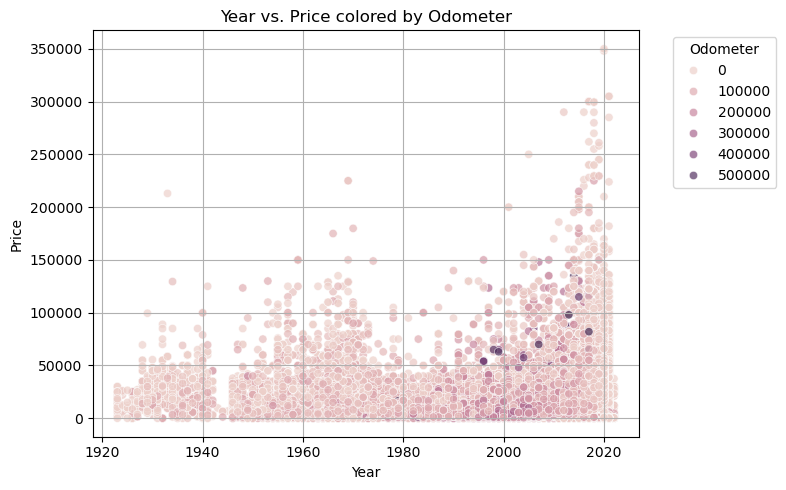

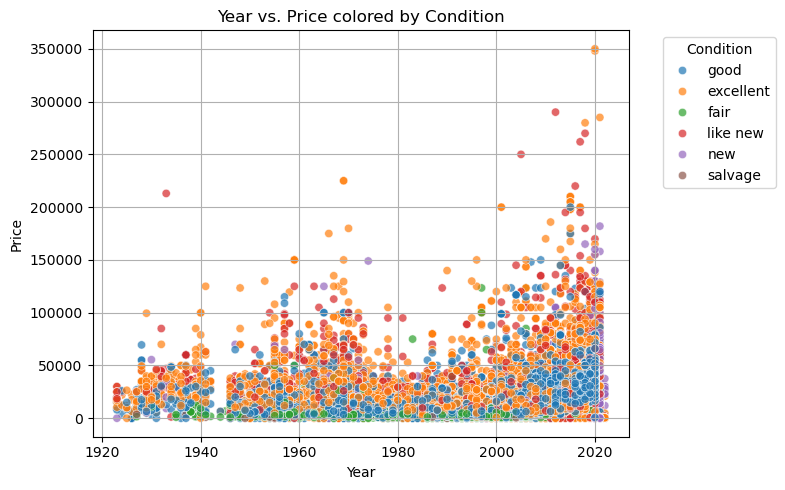

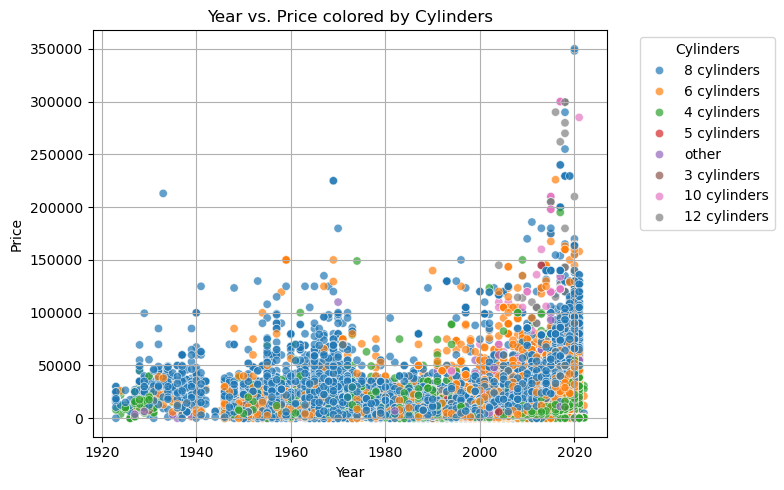

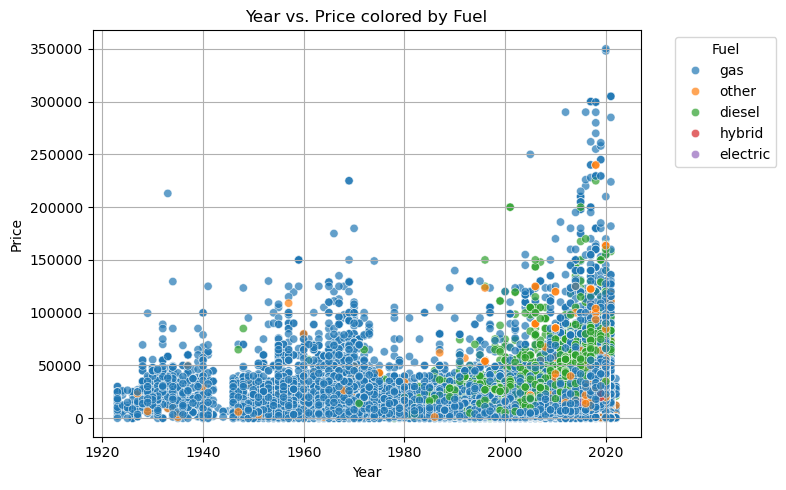

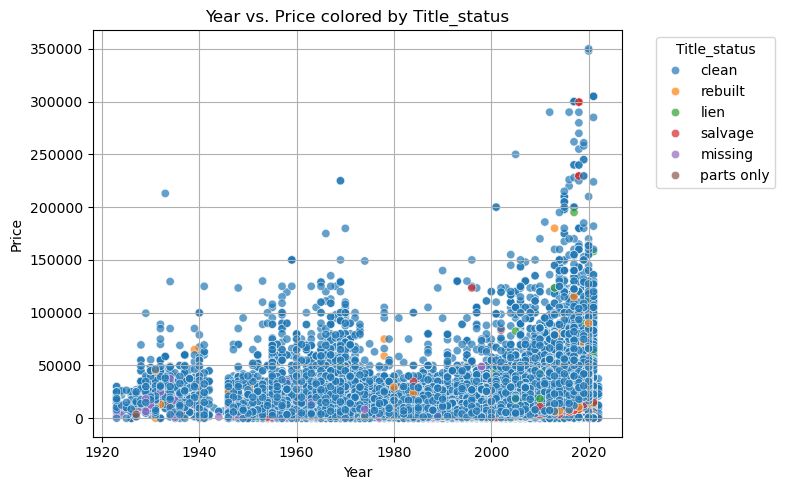

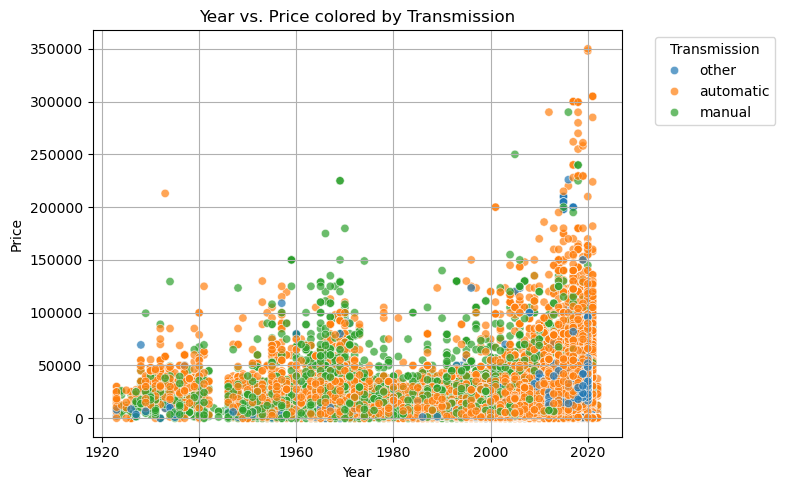

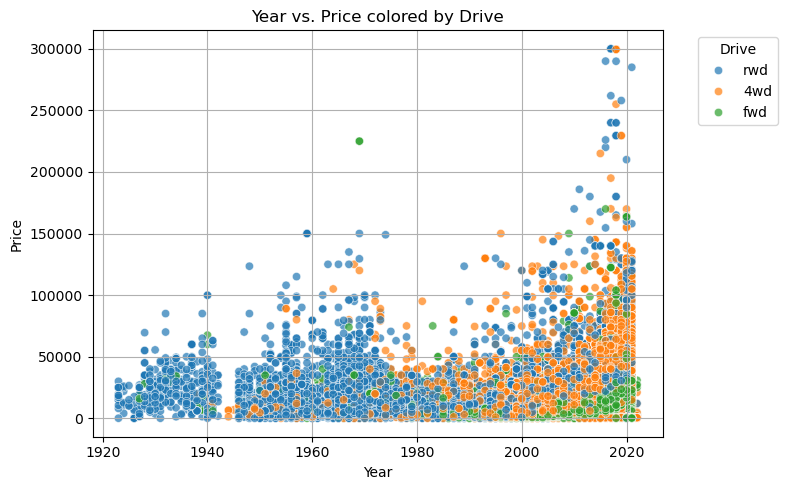

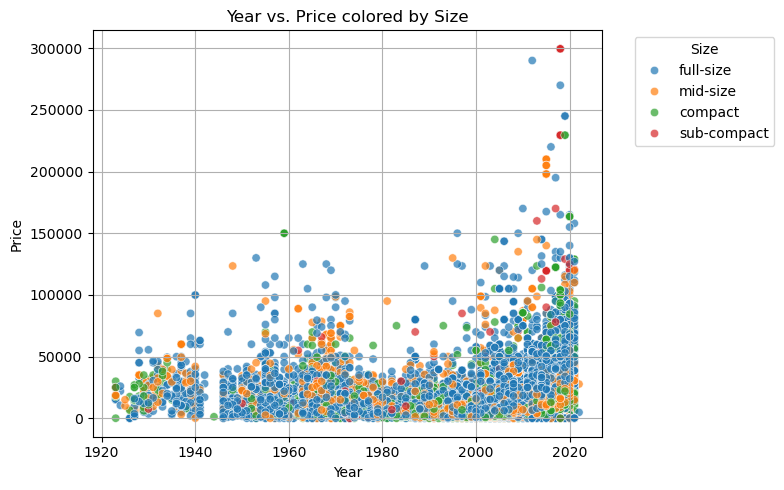

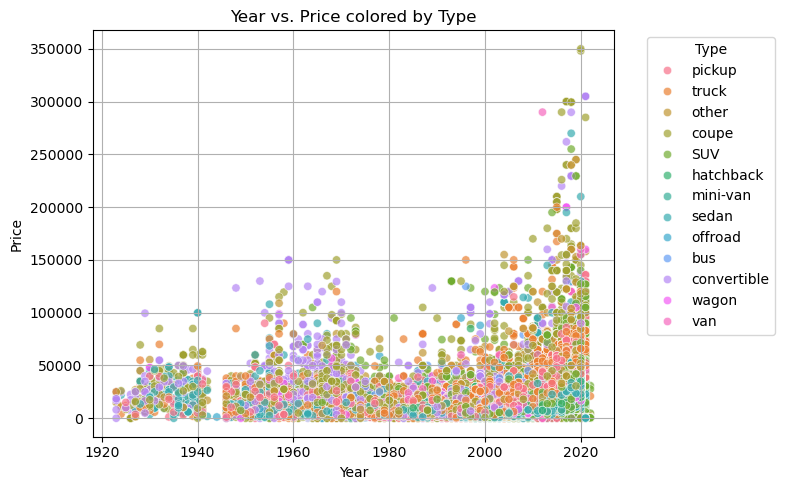

In [129]:
# List of columns you want to use for hue grouping
# Not including: region, manufacturer, state - too many values
#                paint_color - looks evenly distributed
hue_vals = ['odometer', 'condition', 'cylinders', 'fuel', 'title_status', 
            'transmission', 'drive', 'size', 'type']

# Iterate through the list and create a scatter plot for each
for hue in hue_vals:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(data=data, x='year', y='price', hue=hue, alpha=0.7)
    plt.title(f'Year vs. Price colored by {hue.capitalize()}')
    plt.xlabel('Year')
    plt.ylabel('Price')
    plt.legend(title=hue.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()  # adjust plot to make room for legend
    plt.show()

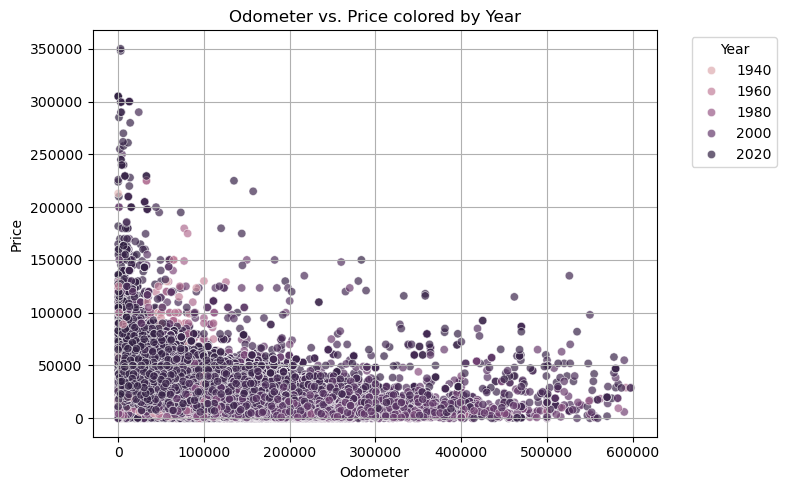

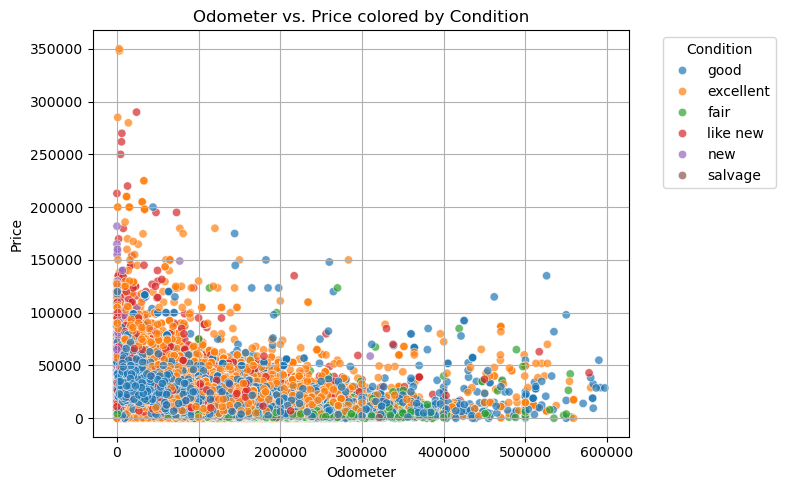

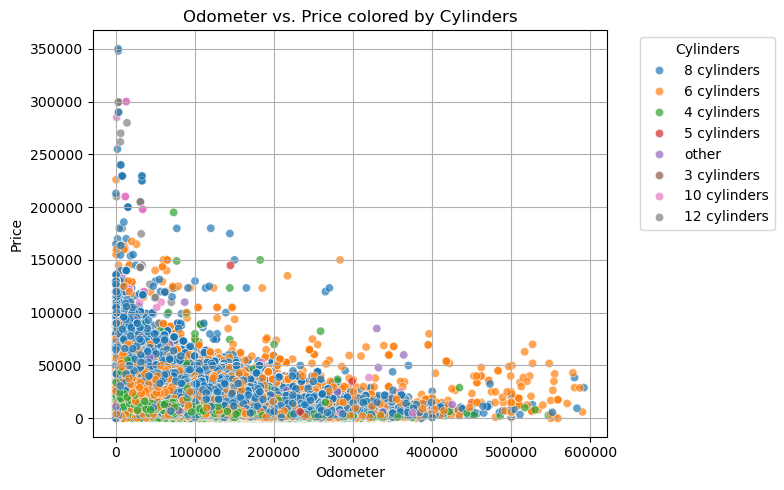

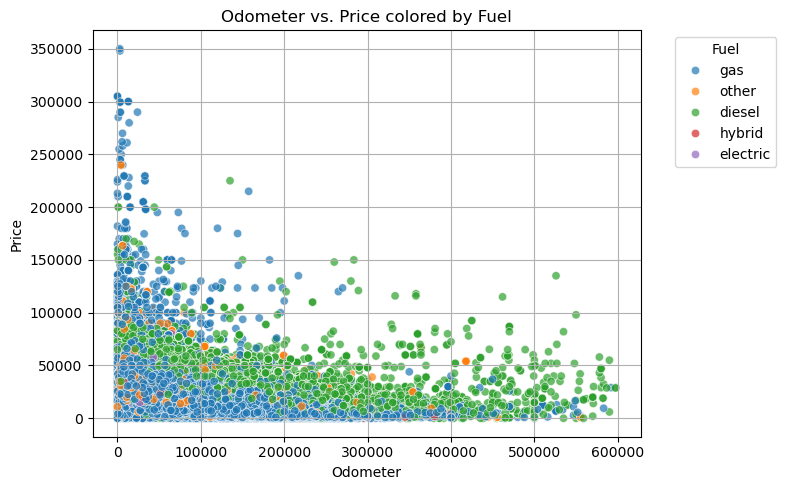

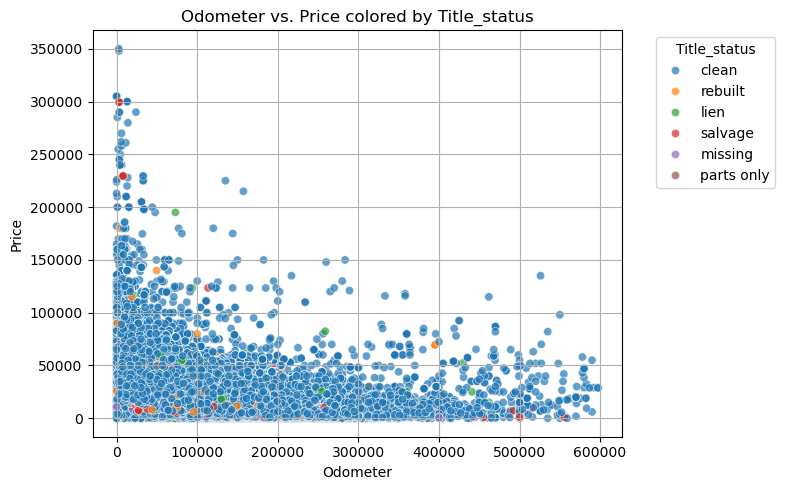

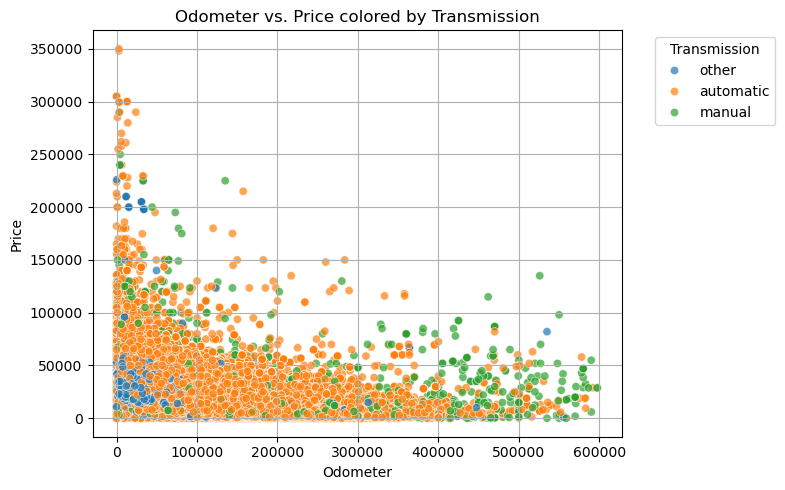

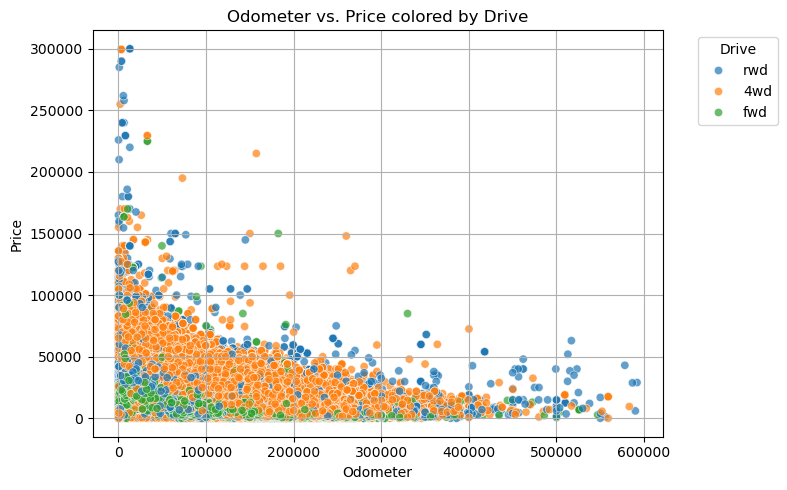

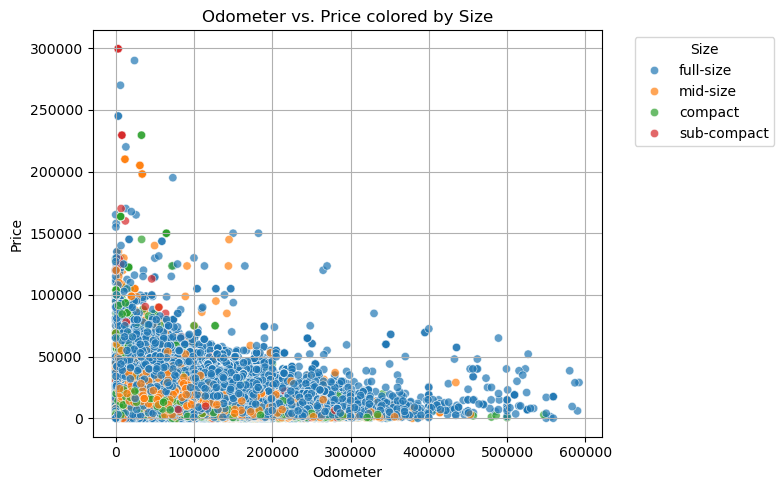

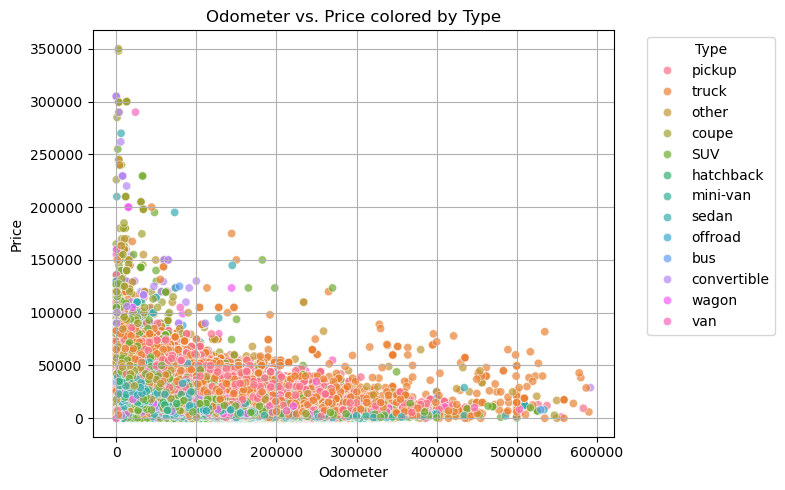

In [130]:
# List of columns you want to use for hue grouping
# Not including: region, manufacturer, state - too many values
#                paint_color - looks evenly distributed
hue_vals = ['year', 'condition', 'cylinders', 'fuel', 'title_status', 
            'transmission', 'drive', 'size', 'type']

# Iterate through the list and create a scatter plot for each
for hue in hue_vals:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(data=data, x='odometer', y='price', hue=hue, alpha=0.7)
    plt.title(f'Odometer vs. Price colored by {hue.capitalize()}')
    plt.xlabel('Odometer')
    plt.ylabel('Price')
    plt.legend(title=hue.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()  # adjust plot to make room for legend
    plt.show()

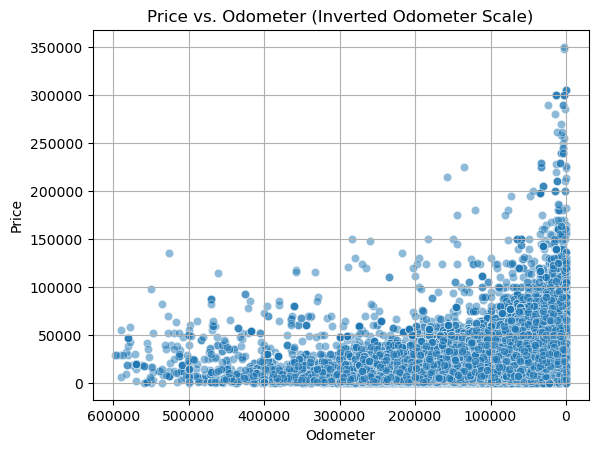

In [131]:
# Scatter plot: Odometer vs. Price
sns.scatterplot(data=data, x='odometer', y='price', alpha=0.5)

# Invert the x-axis so high odometer is on the left
plt.gca().invert_xaxis()

plt.title('Price vs. Odometer (Inverted Odometer Scale)')
plt.xlabel('Odometer')
plt.ylabel('Price')
plt.grid(True)
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


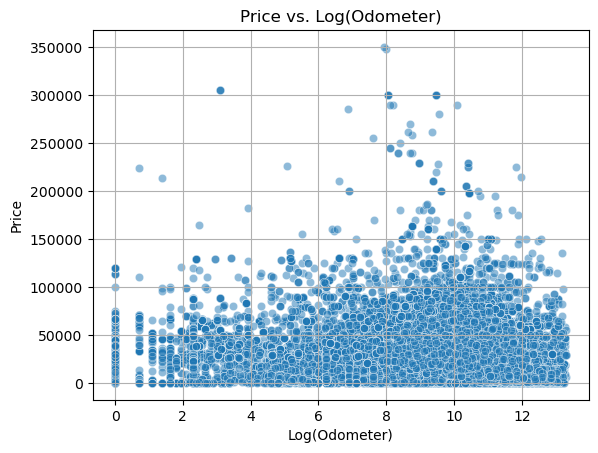

In [132]:
# Add a log-transformed odometer column to your DataFrame
data['log_odometer'] = np.log(data['odometer'])

# Scatter plot: log(Odometer) vs. Price
sns.scatterplot(data=data, x='log_odometer', y='price', alpha=0.5)

plt.title('Price vs. Log(Odometer)')
plt.xlabel('Log(Odometer)')
plt.ylabel('Price')
plt.grid(True)
plt.show()

In [133]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 389421 entries, 27 to 426879
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            389421 non-null  int64  
 1   region        389421 non-null  object 
 2   price         389421 non-null  int64  
 3   year          389421 non-null  float64
 4   manufacturer  374871 non-null  object 
 5   model         384886 non-null  object 
 6   condition     240503 non-null  object 
 7   cylinders     230831 non-null  object 
 8   fuel          387297 non-null  object 
 9   odometer      389421 non-null  float64
 10  title_status  382199 non-null  object 
 11  transmission  387903 non-null  object 
 12  VIN           239397 non-null  object 
 13  drive         270567 non-null  object 
 14  size          110218 non-null  object 
 15  type          304729 non-null  object 
 16  paint_color   273925 non-null  object 
 17  state         389421 non-null  object 
 18  log_odom

In [134]:
data.describe()

,id,price,year,odometer,log_odometer
count,3.894210e+05,389421.000000,389421.000000,389421.000000,3.894210e+05
mean,7.311487e+09,18850.320119,2011.053826,92685.663064,-inf
std,4.386490e+06,15265.750961,9.500636,64540.707653,NaN
min,7.301583e+09,0.000000,1923.000000,0.000000,-inf
25%,7.308123e+09,7000.000000,2008.000000,38071.000000,1.054721e+01
50%,7.312620e+09,15000.000000,2013.000000,87000.000000,1.137366e+01
75%,7.315249e+09,27590.000000,2017.000000,135000.000000,1.181303e+01
max,7.317101e+09,349999.000000,2022.000000,597793.000000,1.330100e+01


In [135]:
data.loc[data['price']==0.0].shape

(44, 19)

In [136]:
data['log_odometer'] = np.log(data['odometer'])

/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [137]:
data['log_price'] = np.log(data['price'])

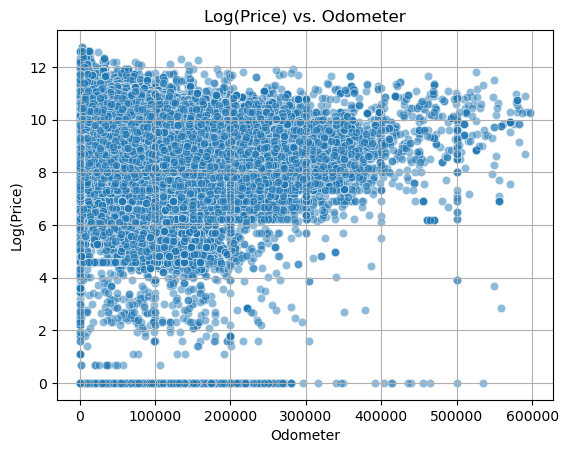

In [139]:
# Scatter plot: log(Odometer) vs. Price
sns.scatterplot(data=data, x='odometer', y='log_price', alpha=0.5)

plt.title('Log(Price) vs. Odometer')
plt.xlabel('Odometer')
plt.ylabel('Log(Price)')
plt.grid(True)
plt.show()

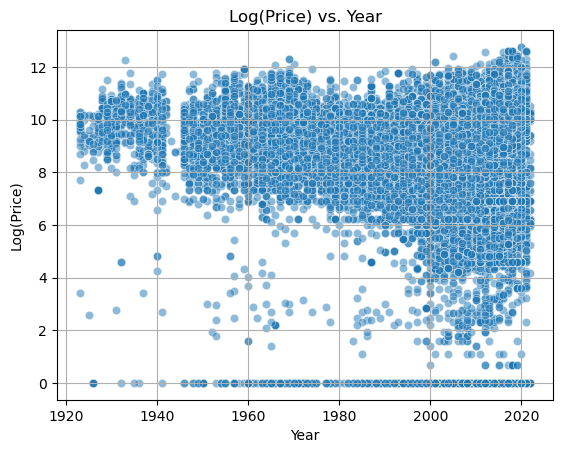

In [140]:
# Scatter plot: log(Odometer) vs. Price
sns.scatterplot(data=data, x='year', y='log_price', alpha=0.5)

plt.title('Log(Price) vs. Year')
plt.xlabel('Year')
plt.ylabel('Log(Price)')
plt.grid(True)
plt.show()

In [141]:
data = data.loc[(~(data['log_price']==0.0))]
data.shape

(387512, 20)

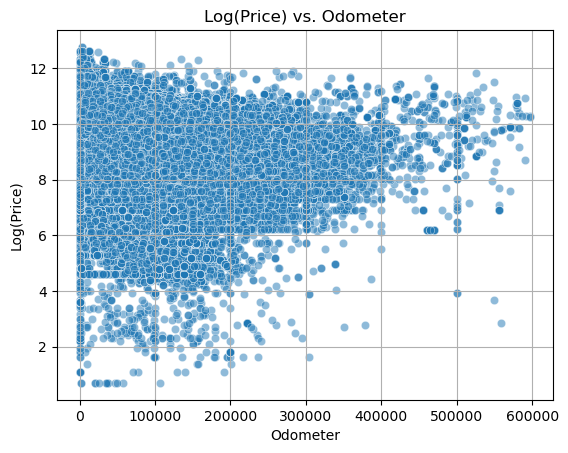

In [142]:
# Scatter plot: log(Odometer) vs. Price
sns.scatterplot(data=data, x='odometer', y='log_price', alpha=0.5)

plt.title('Log(Price) vs. Odometer')
plt.xlabel('Odometer')
plt.ylabel('Log(Price)')
plt.grid(True)
plt.show()

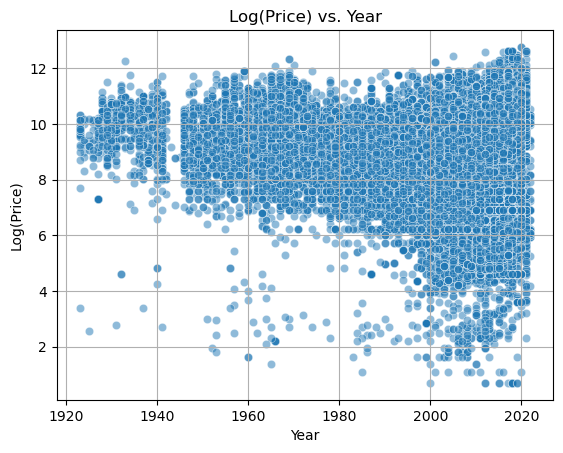

In [143]:
# Scatter plot: log(Odometer) vs. Price
sns.scatterplot(data=data, x='year', y='log_price', alpha=0.5)

plt.title('Log(Price) vs. Year')
plt.xlabel('Year')
plt.ylabel('Log(Price)')
plt.grid(True)
plt.show()

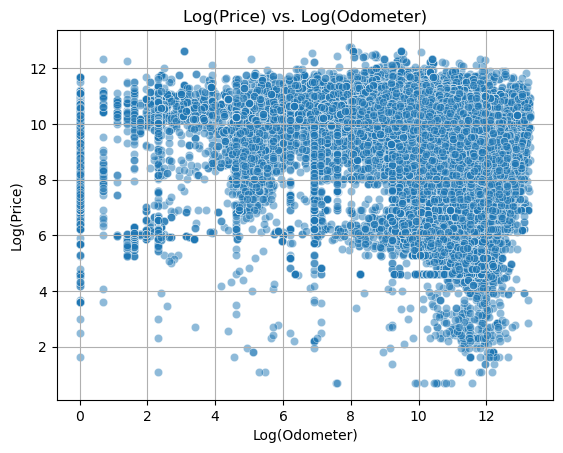

In [144]:
# Scatter plot: log(Odometer) vs. Price
sns.scatterplot(data=data, x='log_odometer', y='log_price', alpha=0.5)

plt.title('Log(Price) vs. Log(Odometer)')
plt.xlabel('Log(Odometer)')
plt.ylabel('Log(Price)')
plt.grid(True)
plt.show()

### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

**Note:** Most of the data preparation was done in the **Data Understanding** section.

In [187]:
data = data[data['price'] > 0]

In [189]:
# Check for infinite values
print(np.isinf(data['log_price']).sum())

# Check for NaN values
print(data['log_price'].isnull().sum())

0
0


### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [159]:
data.head(2)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state,log_odometer,log_price
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,3GTP1VEC4EG551563,NaN,NaN,pickup,white,al,10.966870,10.421984
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,1GCSCSE06AZ123805,NaN,NaN,pickup,blue,al,11.173655,10.025263


In [191]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso

data_model = data.drop(['id','region','model','state','paint_color','VIN','log_odometer'], axis=1)
data_model = pd.get_dummies(data_model, drop_first=True)

X = data_model.drop(['price', 'log_price'], axis=1)
y = data_model['log_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [193]:
data_model.shape

(387468, 85)

In [195]:
data.columns

Index(['id', 'region', 'price', 'year', 'manufacturer', 'model', 'condition',
       'cylinders', 'fuel', 'odometer', 'title_status', 'transmission', 'VIN',
       'drive', 'size', 'type', 'paint_color', 'state', 'log_odometer',
       'log_price'],
      dtype='object')

In [197]:
data_model.columns

Index(['price', 'year', 'odometer', 'log_price', 'manufacturer_alfa-romeo',
       'manufacturer_aston-martin', 'manufacturer_audi', 'manufacturer_bmw',
       'manufacturer_buick', 'manufacturer_cadillac', 'manufacturer_chevrolet',
       'manufacturer_chrysler', 'manufacturer_datsun', 'manufacturer_dodge',
       'manufacturer_ferrari', 'manufacturer_fiat', 'manufacturer_ford',
       'manufacturer_gmc', 'manufacturer_harley-davidson',
       'manufacturer_honda', 'manufacturer_hyundai', 'manufacturer_infiniti',
       'manufacturer_jaguar', 'manufacturer_jeep', 'manufacturer_kia',
       'manufacturer_land rover', 'manufacturer_lexus', 'manufacturer_lincoln',
       'manufacturer_mazda', 'manufacturer_mercedes-benz',
       'manufacturer_mercury', 'manufacturer_mini', 'manufacturer_mitsubishi',
       'manufacturer_morgan', 'manufacturer_nissan', 'manufacturer_pontiac',
       'manufacturer_porsche', 'manufacturer_ram', 'manufacturer_rover',
       'manufacturer_saturn', 'manufactur

In [199]:
data_model.head(2)

,price,year,odometer,log_price,manufacturer_alfa-romeo,manufacturer_aston-martin,manufacturer_audi,manufacturer_bmw,manufacturer_buick,manufacturer_cadillac,manufacturer_chevrolet,manufacturer_chrysler,manufacturer_datsun,manufacturer_dodge,manufacturer_ferrari,manufacturer_fiat,manufacturer_ford,manufacturer_gmc,manufacturer_harley-davidson,manufacturer_honda,manufacturer_hyundai,manufacturer_infiniti,manufacturer_jaguar,manufacturer_jeep,manufacturer_kia,...,fuel_other,title_status_lien,title_status_missing,title_status_parts only,title_status_rebuilt,title_status_salvage,transmission_manual,transmission_other,drive_fwd,drive_rwd,size_full-size,size_mid-size,size_sub-compact,type_bus,type_convertible,type_coupe,type_hatchback,type_mini-van,type_offroad,type_other,type_pickup,type_sedan,type_truck,type_van,type_wagon
27,33590,2014.0,57923.0,10.421984,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
28,22590,2010.0,71229.0,10.025263,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False


In [201]:
ridge = Ridge()

# Grid of alpha values
params = {'alpha': [0.01, 0.1, 1, 10, 100]}

# Grid search with cross-validation
ridge_cv = GridSearchCV(ridge, params, cv=5, scoring='r2')
ridge_cv.fit(X_train, y_train)

print("Best Ridge alpha:", ridge_cv.best_params_)
print("Best Ridge CV R²:", ridge_cv.best_score_)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.65366e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.65366e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Best Ridge alpha: {'alpha': 1}
Best Ridge CV R²: 0.3887069160451141


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

In [249]:
from sklearn.metrics import mean_squared_error

# Best Ridge model
best_ridge = ridge_cv.best_estimator_

# Predict test set
y_pred_ridge = best_ridge.predict(X_test)

# MSE
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
print("Ridge MSE on test set:", mse_ridge)

# RMSE
rmse_ridge = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
print("Ridge RMSE on test set:", rmse_ridge)

Ridge MSE on test set: 0.6732258267218915
Ridge RMSE on test set: 0.8205033983609644


In [217]:
# coefs = 
best_ridge.coef_

array([ 2.16103904e-02, -5.37920077e-06,  2.93869747e-01,  1.58824146e-02,
        2.62912680e-01,  1.10205754e-01, -7.84724597e-02,  1.02141168e-01,
        4.28324468e-02, -2.64094276e-01,  5.20895994e-01, -2.30229792e-01,
        1.60057429e+00, -4.59229986e-01,  8.24038043e-02,  1.43704328e-01,
       -4.17430953e-01, -1.25781717e-02, -1.60124161e-01,  1.65015272e-01,
        9.77251974e-02,  9.61199986e-02, -2.11475551e-01, -8.40605851e-02,
        3.28404921e-01,  1.68713389e-01, -1.76930714e-01,  1.45995792e-01,
       -5.76753665e-01, -3.95871070e-02, -2.58805969e-01, -1.27959267e+00,
       -1.58890406e-01, -2.36066252e-01,  6.67980341e-01,  1.21745051e-01,
        3.70461912e-01, -5.77196836e-01,  9.69880715e-03,  6.69102244e-01,
        1.37226696e-01, -2.04384380e-01,  1.21765454e-01, -8.41166399e-01,
       -5.48414948e-02,  2.92795230e-02, -1.49129924e-01, -9.94109199e-01,
        6.03745044e-01, -3.51012119e-01, -2.42281671e-01, -2.75962499e-01,
       -3.66247617e-02,  

In [219]:
data_model.columns

Index(['price', 'year', 'odometer', 'log_price', 'manufacturer_alfa-romeo',
       'manufacturer_aston-martin', 'manufacturer_audi', 'manufacturer_bmw',
       'manufacturer_buick', 'manufacturer_cadillac', 'manufacturer_chevrolet',
       'manufacturer_chrysler', 'manufacturer_datsun', 'manufacturer_dodge',
       'manufacturer_ferrari', 'manufacturer_fiat', 'manufacturer_ford',
       'manufacturer_gmc', 'manufacturer_harley-davidson',
       'manufacturer_honda', 'manufacturer_hyundai', 'manufacturer_infiniti',
       'manufacturer_jaguar', 'manufacturer_jeep', 'manufacturer_kia',
       'manufacturer_land rover', 'manufacturer_lexus', 'manufacturer_lincoln',
       'manufacturer_mazda', 'manufacturer_mercedes-benz',
       'manufacturer_mercury', 'manufacturer_mini', 'manufacturer_mitsubishi',
       'manufacturer_morgan', 'manufacturer_nissan', 'manufacturer_pontiac',
       'manufacturer_porsche', 'manufacturer_ram', 'manufacturer_rover',
       'manufacturer_saturn', 'manufactur

In [233]:
coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': best_ridge.coef_,
    'Count': (X_train != 0).sum().values 
})

In [235]:
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)

In [237]:
coef_df

,Feature,Coefficient,Count
12,manufacturer_ferrari,1.600574,64
61,title_status_parts only,-1.535052,125
31,manufacturer_morgan,-1.279593,1
47,condition_salvage,-0.994109,463
43,condition_fair,-0.841166,5285
55,fuel_electric,-0.812043,1297
60,title_status_missing,-0.758357,593
57,fuel_hybrid,-0.695854,3973
56,fuel_gas,-0.683683,260049
39,manufacturer_tesla,0.669102,682


In [245]:
coef_df.sort_values(by='Coefficient', ascending=False)

,Feature,Coefficient,Count
12,manufacturer_ferrari,1.600574,64
39,manufacturer_tesla,0.669102,682
34,manufacturer_porsche,0.667980,1018
48,cylinders_12 cylinders,0.603745,160
10,manufacturer_datsun,0.520896,51
78,type_pickup,0.371578,32507
36,manufacturer_rover,0.370462,1566
76,type_offroad,0.341091,467
24,manufacturer_lexus,0.328405,6091
80,type_truck,0.324942,24177


In [247]:
coef_df.sort_values(by='Coefficient', ascending=True)

,Feature,Coefficient,Count
61,title_status_parts only,-1.535052,125
31,manufacturer_morgan,-1.279593,1
47,condition_salvage,-0.994109,463
43,condition_fair,-0.841166,5285
55,fuel_electric,-0.812043,1297
60,title_status_missing,-0.758357,593
57,fuel_hybrid,-0.695854,3973
56,fuel_gas,-0.683683,260049
58,fuel_other,-0.602656,22360
37,manufacturer_saturn,-0.577197,853


In [241]:
coef_df.loc[coef_df['Count'] > 1000].sort_values(by='Coefficient', ascending=False)

,Feature,Coefficient,Count
34,manufacturer_porsche,0.667980,1018
78,type_pickup,0.371578,32507
36,manufacturer_rover,0.370462,1566
24,manufacturer_lexus,0.328405,6091
80,type_truck,0.324942,24177
4,manufacturer_audi,0.262913,5721
65,transmission_other,0.262090,48707
77,type_other,0.240554,15740
59,title_status_lien,0.220101,1121
81,type_van,0.202076,6275


In [243]:
coef_df.loc[coef_df['Count'] > 1000].sort_values(by='Coefficient', ascending=True)

,Feature,Coefficient,Count
43,condition_fair,-0.841166,5285
55,fuel_electric,-0.812043,1297
57,fuel_hybrid,-0.695854,3973
56,fuel_gas,-0.683683,260049
58,fuel_other,-0.602656,22360
63,title_status_salvage,-0.331047,3021
51,cylinders_5 cylinders,-0.275962,1310
9,manufacturer_chrysler,-0.264094,4506
30,manufacturer_mitsubishi,-0.258806,2484
50,cylinders_4 cylinders,-0.242282,57731


### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

# What Drives the Price of a Used Car?
## Final Report Summary for Used Car Dealership Group

---

## 📌 Business Objective  
The goal of this analysis was to identify the key factors that influence the price of used cars, using a dataset of car listings. By understanding which features most impact pricing, dealerships can make better-informed decisions about inventory selection, pricing strategy, and identifying undervalued vehicles.

---

## 📌 Primary Findings  

After cleaning the data and fitting a regularized Ridge regression model (to handle multicollinearity and overfitting), we identified the features with the strongest relationships to car prices.

### **Top Positive Price Drivers (Features Associated with Higher Prices):**

| Feature                     | Coefficient | Count |
|:----------------------------|:--------------|:--------|
| **manufacturer_ferrari**     | **+1.60**     | 64     |
| manufacturer_tesla           | +0.67        | 682    |
| manufacturer_porsche         | +0.67        | 1018   |
| cylinders_12 cylinders       | +0.60        | 160    |
| type_pickup                  | +0.37        | 32,507 |
| manufacturer_rover           | +0.37        | 1566   |

**Interpretation:**  
- Luxury and exotic brands (Ferrari, Tesla, Porsche) predictably command higher prices.
- 12-cylinder engines (rare, high-performance vehicles) are valued higher.
- Pickup trucks also tend to sell for higher prices, likely due to demand for utility vehicles.

---

### **Top Negative Price Drivers (Features Associated with Lower Prices):**

| Feature                     | Coefficient | Count |
|:----------------------------|:--------------|:--------|
| **title_status_parts only**  | **-1.53**     | 125    |
| condition_salvage            | -0.99        | 463    |
| condition_fair               | -0.84        | 5285   |
| fuel_electric                | -0.81        | 1297   |
| title_status_missing         | -0.76        | 593    |
| fuel_hybrid                  | -0.70        | 3973   |

**Interpretation:**  
- “Parts only” or “salvage” title status massively reduces value.
- Fair or poor vehicle condition lowers price significantly.
- Interestingly, electric and hybrid vehicles in this dataset sold at lower prices, likely due to model-year age, battery condition, or limited regional demand in this sample.

---

## 📌 Secondary Insights  

- **Year (age of vehicle)** had a small positive relationship with price — but much less than brand or title/condition.
- **Odometer readings (mileage)** had a negligible coefficient near zero in this regularized model, suggesting that after adjusting for other factors like brand, type, and condition, mileage’s incremental effect on price was diminished.
- Popular manufacturers like **Ford, Toyota, and Honda** had moderate or slightly positive coefficients, reflecting steady market demand but not premium pricing.

---

## 📌 Recommendations for Dealers  

1. **Prioritize high-demand makes and body types** — luxury brands, pickup trucks, and rare performance vehicles show consistently higher pricing power.
2. **Avoid vehicles with salvage, parts-only, or missing title statuses** — these severely hurt resale value.
3. **Invest in inventory with verified good or like-new condition** — the price drop-off for “fair” or “salvage” condition is sharp.
4. **Monitor market-specific demand for electric/hybrid vehicles** — while their coefficients were negative here, regional demand variations could make these viable in specific locations.
5. Use **feature importance insights** like this to support pricing strategy and appraisals during trade-ins.

---

## 📌 Next Steps  

- Integrate real-time market data to track shifts in demand for specific fuel types or vehicle types.
- Use separate models for regional markets since pricing behavior varies by location.
- Consider adding more vehicle attributes (like battery health for EVs, accident history, etc.) for more precise pricing models.

---

## 📌 Final Note  

**This Ridge regression model prioritized predictive accuracy over statistical p-values** (since regularized models don’t produce classic significance tests). Coefficient magnitudes and direction provide clear, actionable guidance on which features most impact price.


**Note:** I received help from GenAI to improve wording and recommendations on how to format the above markdown cell more nicely.